# Setting Up

In [ ]:
pip install gerrychain[geo]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.9/87.9 kB 4.0 MB/s eta 0:00:00


In [ ]:
# For working with graphs
import networkx as nx
# For making plots
import matplotlib.pyplot as plt
import numpy as np

# Needed for gerrchain
import gerrychain
from gerrychain import Graph, Partition, proposals, updaters, constraints, accept, MarkovChain, GeographicPartition
from gerrychain.updaters import cut_edges, Tally
from gerrychain.tree import recursive_tree_part
from gerrychain.proposals import recom
from gerrychain.accept import always_accept
from functools import partial
import geopandas as gpd
import pandas as pd

# same randomness
import random
random.seed(123456)

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import pickle

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Mounted at /content/drive


# Importing Data

In [ ]:
#shp file
mi_gdf = gpd.read_file("/content/mi16_results.shp")
mi_graph = Graph.from_file("/content/mi16_results.shp")

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()
/usr/local/lib/python3.10/dist-packages/gerrychain/graph/adjacency.py:112: UserWarning: Found overlaps among the given polygons. Indice

In [ ]:
#getting longitude and latitude
print(mi_gdf['geometry'])
# Function to get first coordinate pair
def get_first_coordinate(geometry):
    # Handle Polygon and MultiPolygon
    if geometry.geom_type == 'Polygon':
        return geometry.exterior.coords[0]
    elif geometry.geom_type == 'MultiPolygon':
        return geometry.geoms[0].exterior.coords[0]
mi_gdf['longitude'], mi_gdf['latitude'] = zip(*mi_gdf['geometry'].apply(get_first_coordinate))
print(mi_gdf['longitude'])
print(mi_gdf['latitude'])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0       POLYGON ((5844033.503 -97923.017, 5843922.32 -...
1       POLYGON ((6117500.79 -99293.974, 6117425.98 -9...
2       POLYGON ((6104316.452 -105716.162, 6104327.589...
3       POLYGON ((6111119.503 83072.935, 6111131.714 8...
4       POLYGON ((5702887.89 326093.42, 5702870.013 32...
                              ...                        
4804    MULTIPOLYGON (((5979521.793 8469.993, 5979526....
4805    POLYGON ((5998652.59 331826.622, 5998651.373 3...
4806    POLYGON ((5967624.323 30441.063, 5967623.054 3...
4807    POLYGON ((6000145.139 -110165.793, 6000138.931...
4808    POLYGON ((5872223.31 -36400.74, 5872250.46 -36...
Name: geometry, Length: 4809, dtype: geometry
0       5.844034e+06
1       6.117501e+06
2       6.104316e+06
3       6.111120e+06
4       5.702888e+06
            ...     
4804    5.979522e+06
4805    5.998653e+06
4806    5.967624e+06
4807    6.000145e+06
4808    5.872223e+06
Name: longitude, Length: 4809, dtype: float64
0       -97923.016583
1       -99293.97

In [ ]:
# Save the fixed GeoDataFrame to a new shapefile
mi_gdf.to_file("/content/mi_fixed.shp")
mi_graph = Graph.from_file("/content/mi_fixed.shp")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/gerrychain/graph/adjacency.py:112: UserWarning: Found overlaps among the given polygons. Indices of overlaps: {(3661, 4065), (3909, 4065)}
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/gerrychain/graph/graph.py:406: UserWarning: Found islands (degree-0 nodes). Indices of islands: {272, 655, 21, 181}
  warnings.warn(


In [ ]:
print(mi_graph.nodes()[0].keys())

dict_keys(['boundary_node', 'area', 'VTD2016_x', 'ShapeSTLen', 'CountyFips', 'Jurisdicti', 'ElectionYe', 'Label', 'VTD', 'county_nam', 'county_fip', 'county_lat', 'county_lon', 'jurisdic_1', 'precinct', 'PRES16D', 'PRES16R', 'PRES16L', 'PRES16G', 'GOV18D', 'GOV18R', 'SOS18D', 'SOS18R', 'AG18D', 'AG18R', 'SEN18D', 'SEN18R', 'HDIST', 'SENDIST', 'CD', 'TOTPOP', 'NH_WHITE', 'NH_BLACK', 'NH_AMIN', 'NH_ASIAN', 'NH_NHPI', 'NH_OTHER', 'HISP', 'H_WHITE', 'H_BLACK', 'H_AMIN', 'H_ASIAN', 'H_NHPI', 'H_OTHER', 'VAP', 'HVAP', 'WVAP', 'BVAP', 'AMINVAP', 'ASIANVAP', 'NHPIVAP', 'OTHERVAP', '2MOREVAP', 'NH_2MORE', 'H_2MORE', 'longitude', 'latitude', 'geometry'])


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
print("Is this dual graph connected? ", nx.is_connected(mi_graph))
print("Is this dual graph planar? ", nx.is_planar(mi_graph))
print("Number of Nodes: ", len(mi_graph.nodes()))
print("Number of Edges: ", len(mi_graph.edges()))

Is this dual graph connected?  False
Is this dual graph planar?  False
Number of Nodes:  4809
Number of Edges:  12544


In [ ]:
# List of populations at each node
list_of_pop = [mi_graph.nodes()[v]['TOTPOP'] for v in mi_graph.nodes()]


# Total population
total_pop = sum(list_of_pop)

print("Total Population: ", total_pop)

Total Population:  9883640


# Look at enacted districting plan in 2011

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


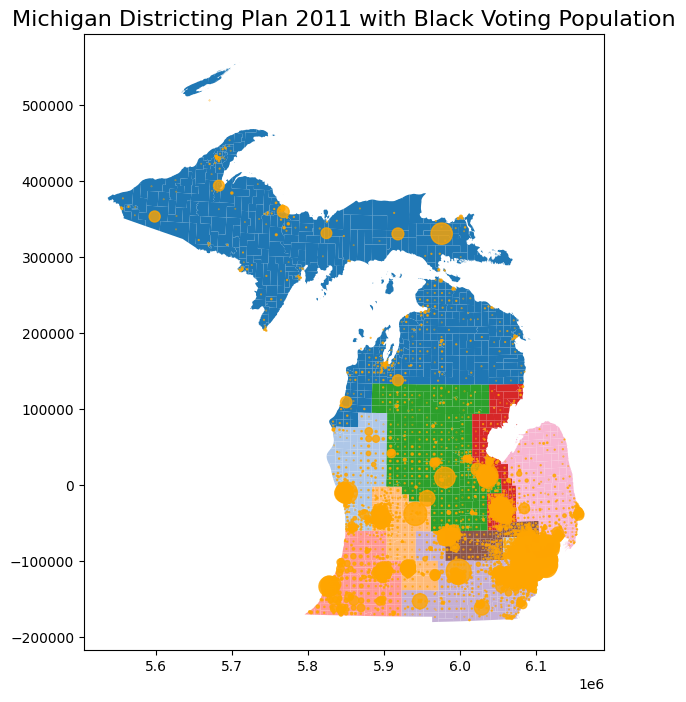

In [ ]:
plan2011 = GeographicPartition(mi_graph, assignment = "CD")
# Draw the map

fig, ax = plt.subplots(figsize=(16, 8))
mi_gdf.plot(pd.Series([plan2011.assignment[i] for i in mi_gdf.index]), cmap="tab20", ax=ax)

# Add a scatter plot for 'BVAP'
mi_gdf['centroid'] = mi_gdf['geometry'].centroid  # Get centroids for each shape
mi_gdf['x'] = mi_gdf['centroid'].apply(lambda point: point.x)
mi_gdf['y'] = mi_gdf['centroid'].apply(lambda point: point.y)

# Scatter plot with size proportional to 'BVAP' values
ax.scatter(
    mi_gdf['x'],
    mi_gdf['y'],
    s=mi_gdf['BVAP'] * 0.1,  # Adjust size based on population values
    color='orange',               # Darker color for the dots
    alpha=0.8, # Higher opacity for more visibility
)

# Add a title
ax.set_title('Michigan Districting Plan 2011 with Black Voting Population', fontsize=16)

plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


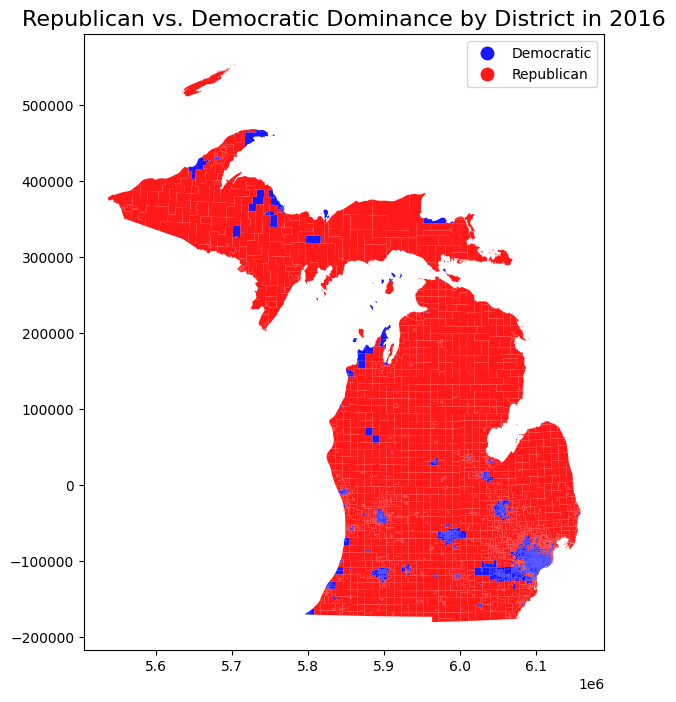

In [ ]:
# Create the figure and axis
fig, ax = plt.subplots(figsize=(16, 8))

# Calculate the ratio of Republican to Democratic votes
mi_gdf['R_to_D_ratio'] = mi_gdf['PRES16R'] / (mi_gdf['PRES16D'] + 1e-10)  # Adding a small value to avoid division by zero

# Create a categorical column for better visualization
mi_gdf['R_or_D'] = np.where(mi_gdf['R_to_D_ratio'] > 1, 'Republican', 'Democratic')

# Plot the districts with colors based on Republican or Democratic dominance
mi_gdf.plot(
    column='R_or_D',          # Column for categorical data (Republican or Democratic)
    cmap='bwr',               # Color scheme for clear distinction (blue for D, red for R)
    ax=ax,
    legend=True,              # Add a colorbar for the categories
    alpha=0.9                 # Less transparency for better visibility
)

# Add a title
ax.set_title('Republican vs. Democratic Dominance by District in 2016', fontsize=16)

# Display the plot
plt.show()


## Make an initial districting plan and graph

In [ ]:
num_dist = 13 # Number of Congressional Districts in MI
ideal_pop = total_pop/num_dist
pop_tolerance = 0.02
initial_plan = recursive_tree_part(mi_graph, range(num_dist), ideal_pop, 'TOTPOP', pop_tolerance, 10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


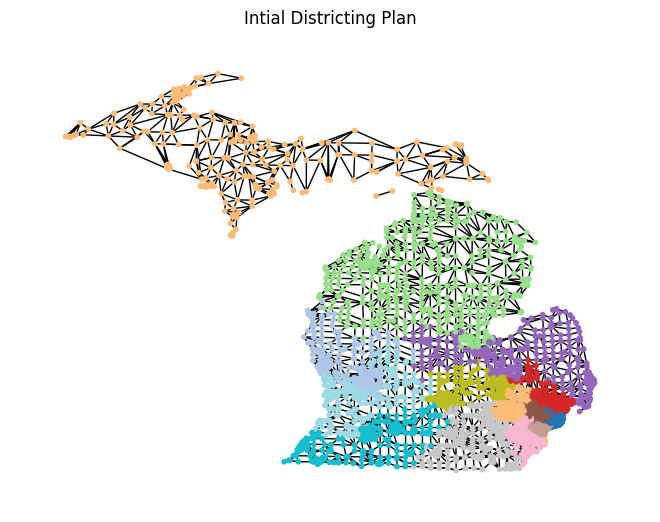

In [69]:
node_locations = { v : ( float(mi_graph.nodes()[v]["longitude"]), float(mi_graph.nodes()[v]["latitude"])) for v in mi_graph.nodes() }
plt.figure()
nx.draw(mi_graph, node_size = 10,  node_color = [initial_plan[v] for v in mi_graph.nodes()], pos = node_locations, cmap="tab20")
plt.title('Intial Districting Plan')
plt.show()

In [ ]:
cutedges = 0

for e in mi_graph.edges():
  if initial_plan[e[0]] != initial_plan[e[1]]:
    cutedges += 1

print("Number of cutedges in initial_plan: ", cutedges)

Number of cutedges in initial_plan:  868


In [ ]:
cutedges = 0

for e in mi_graph.edges():
  if plan2011.assignment[e[0]] != plan2011.assignment[e[1]]:
    cutedges += 1

print("Number of cutedges in plan 2011: ", cutedges)

Number of cutedges in plan 2011:  1049


In [ ]:
#population of each district
dist_pops = [0]*num_dist
for v in mi_graph.nodes():
  dist = initial_plan[v]
  dist_pops[dist] = dist_pops[dist] + mi_graph.nodes()[v]['TOTPOP']

print("Populations of Districts: ", dist_pops)

Populations of Districts:  [754525, 761532, 757200, 773312, 757210, 747733, 775409, 747456, 766814, 747766, 760909, 765029, 768745]


## Set up random walk based on initial districting plan

In [ ]:
#Set up partition object
initial_partition = Partition(
    mi_graph, #dual graph
    assignment = initial_plan, #initial districting plan
    updaters = {
        "our cut edges": cut_edges,
        "district population": Tally("TOTPOP", alias = "district population"),
        "district BVAP": Tally("BVAP", alias = "district BVAP"), #Black Voting Age Population
        "R Votes": Tally("PRES16R", alias = "R Votes"),
        "D Votes": Tally("PRES16D", alias = "D Votes")
    }
)

In [ ]:
# step in random walk

rw_proposal = partial(recom, ## how you choose a next districting plan
                      pop_col = "TOTPOP", ## What data describes population?
                      pop_target = ideal_pop, ## What the target/ideal population is for each district
                                              ## (we calculated ideal pop above)
                      epsilon = pop_tolerance,  ## how far from ideal population you can deviate
                                              ## (we set pop_tolerance above)
                       node_repeats = 1 ## number of times to repeat bipartition.  Can increase if you get a BipartitionWarning
                      )

In [ ]:
population_constraint = constraints.within_percent_of_ideal_population(
    initial_partition,
    pop_tolerance,
    pop_key = "district population"

    )

Creating the chain

In [ ]:
our_random_walk = MarkovChain(
    proposal = rw_proposal,
    constraints = [population_constraint],
    accept = always_accept, #accepts every proposed plan that meets population criteria,
    initial_state = initial_partition,
    total_steps = 10000
)

#Run initial plan for double the amount of steps

In [ ]:
our_random_walk_double = MarkovChain(
    proposal = rw_proposal,
    constraints = [population_constraint],
    accept = always_accept, #accepts every proposed plan that meets population criteria,
    initial_state = initial_partition,
    total_steps = 20000
)

# Set up random walk based on 2011 plan - this gets stuck so I changed node repeats and population tolerance to 0.1

In [54]:
#Set up partition object
partition_2011 = Partition(
    mi_graph, #dual graph
    assignment = plan2011.assignment, #2011 districting plan
    updaters = {
        "our cut edges": cut_edges,
        "district population": Tally("TOTPOP", alias = "district population"),
        "district BVAP": Tally("BVAP", alias = "district BVAP"), #Black Voting Age Population
        "R Votes": Tally("PRES16R", alias = "R Votes"),
        "D Votes": Tally("PRES16D", alias = "D Votes")
    }
)

In [57]:
# step in random walk
#increase population tolerance?
pop_tolerance11 = 0.1
rw_proposal = partial(recom, ## how you choose a next districting plan
                      pop_col = "TOTPOP", ## What data describes population?
                      pop_target = ideal_pop, ## What the target/ideal population is for each district
                                              ## (we calculated ideal pop above)
                      epsilon = pop_tolerance11,  ## how far from ideal population you can deviate
                                              ## (we set pop_tolerance above)
                       node_repeats = 3 ## number of times to repeat bipartition.  Can increase if you get a BipartitionWarning
                      )

In [58]:
population_constraint11 = constraints.within_percent_of_ideal_population(
    partition_2011,
    pop_tolerance11,
    pop_key = "district population"

    )

In [59]:
our_2011_walk = MarkovChain(
    proposal = rw_proposal,
    constraints = [population_constraint11],
    accept = always_accept, #accepts every proposed plan that meets population criteria,
    initial_state = partition_2011,
    total_steps = 10000
)

In [60]:
cutedge_ensemble_2011 = []
bmaj_ensemble_2011 = []
d_ensemble_2011 = []
bpop_2011 = []

for part in our_2011_walk:
    # Add cutedges to cutedges ensemble
    cutedge_ensemble_2011.append(len(part["our cut edges"]))

    # Calculate number of black-majority districts
    # Add to ensemble
    num_maj_black = 0
    bpop_this_step = []
    # for i in range(num_dist):
    for key in part["district BVAP"]:
      b_perc = part["district BVAP"][key] / part["district population"][key]
      bpop_this_step.append(b_perc)
      if b_perc >= 0.5:
        num_maj_black = num_maj_black + 1

    bpop_this_step.sort()
    bpop_2011.append(bpop_this_step)
    bmaj_ensemble_2011.append(num_maj_black)

    # Calculate number of districts with more Democratic votes than Republican votes
    d = 0

    # for i in range(1, num_dist+1):
    for key in part["R Votes"]:
      if part["R Votes"][key] <  part["D Votes"][key]:
        d = d + 1
    d_ensemble_2011.append(d)


print(cutedge_ensemble_2011)
print(bmaj_ensemble_2011)
print(d_ensemble_2011)
print(bpop_2011)

[1049, 1047, 1014, 1012, 1003, 1003, 1006, 1006, 1008, 992, 990, 987, 1001, 981, 975, 939, 916, 939, 925, 937, 905, 902, 908, 912, 934, 963, 958, 973, 941, 940, 927, 920, 926, 920, 914, 883, 879, 888, 887, 888, 875, 884, 881, 870, 864, 872, 896, 901, 905, 916, 924, 913, 915, 910, 891, 884, 893, 871, 852, 834, 819, 812, 809, 814, 821, 818, 806, 844, 916, 926, 922, 925, 917, 919, 917, 917, 951, 961, 974, 979, 923, 908, 907, 910, 910, 928, 922, 915, 894, 884, 897, 878, 888, 885, 881, 885, 874, 876, 874, 870, 863, 882, 906, 908, 906, 910, 910, 880, 901, 912, 889, 876, 904, 899, 900, 878, 882, 870, 856, 866, 887, 889, 895, 893, 902, 918, 919, 936, 947, 938, 954, 913, 917, 913, 905, 874, 865, 860, 870, 867, 849, 879, 913, 906, 913, 908, 888, 906, 885, 897, 889, 903, 907, 914, 909, 958, 946, 915, 933, 947, 950, 946, 946, 958, 931, 915, 918, 911, 913, 904, 911, 904, 928, 915, 937, 952, 957, 982, 937, 916, 925, 932, 905, 908, 920, 932, 917, 939, 971, 983, 985, 966, 934, 948, 947, 959, 960, 968,

In [62]:
#saving these in a pickle so I don't have to run random walk again

# Save variables to a pickle file
with open('/content/drive/My Drive/ensemble_outputs_2011.pkl', 'wb') as f:
    pickle.dump({
        'cutedge_ensemble_2011': cutedge_ensemble_2011,
        'bmaj_ensemble_2011': bmaj_ensemble_2011,
        'd_ensemble_2011': d_ensemble_2011,
        'bpop_2011': bpop_2011
    }, f)

# Run Random Walk initial

In [23]:
cutedge_ensemble = []
bmaj_ensemble = []
d_ensemble = []
bpop = []

for part in our_random_walk:
    # Add cutedges to cutedges ensemble
    cutedge_ensemble.append(len(part["our cut edges"]))

    # Calculate number of black-majority districts
    # Add to ensemble
    num_maj_black = 0
    bpop_this_step = []
    for i in range(num_dist):
      b_perc = part["district BVAP"][i] / part["district population"][i]
      bpop_this_step.append(b_perc)
      if b_perc >= 0.5:
        num_maj_black = num_maj_black + 1

    bpop_this_step.sort( )
    bpop.append(bpop_this_step)
    bmaj_ensemble.append(num_maj_black)

    # Calculate number of districts with more Democratic votes than Republican votes
    d = 0

    for i in range(num_dist):
      if part["R Votes"][i] <  part["D Votes"][i]:
        d = d + 1
    d_ensemble.append(d)


print(cutedge_ensemble)
print(bmaj_ensemble)
print(d_ensemble)
print(bpop)

/usr/local/lib/python3.10/dist-packages/gerrychain/tree.py:704: BipartitionWarning: 
Failed to find a balanced cut after 1000 attempts.
If possible, consider enabling pair reselection within your
MarkovChain proposal method to allow the algorithm to select
a different pair of districts for recombination.
  warnings.warn(


[868, 857, 880, 870, 890, 883, 893, 864, 861, 860, 858, 837, 840, 825, 835, 814, 825, 824, 820, 831, 793, 788, 814, 803, 803, 799, 830, 831, 816, 822, 850, 869, 885, 900, 921, 908, 913, 926, 891, 899, 895, 910, 914, 898, 909, 929, 925, 938, 976, 983, 987, 985, 967, 933, 943, 932, 909, 923, 931, 922, 930, 860, 879, 888, 892, 850, 839, 846, 851, 852, 852, 852, 862, 838, 826, 835, 812, 838, 840, 850, 838, 830, 851, 836, 817, 810, 816, 830, 823, 831, 849, 834, 822, 827, 812, 805, 808, 813, 834, 796, 801, 802, 790, 807, 797, 784, 783, 783, 784, 765, 753, 751, 779, 747, 769, 786, 786, 817, 831, 834, 818, 839, 840, 856, 855, 861, 872, 875, 835, 842, 834, 860, 851, 837, 837, 843, 849, 823, 815, 792, 784, 779, 755, 784, 786, 801, 795, 838, 841, 823, 804, 836, 817, 855, 846, 883, 867, 879, 860, 833, 838, 839, 856, 835, 883, 884, 980, 990, 999, 1029, 1028, 1043, 944, 955, 962, 946, 946, 948, 931, 920, 914, 875, 910, 905, 876, 872, 872, 868, 824, 820, 840, 833, 852, 856, 855, 853, 850, 852, 854, 8

In [24]:
#saving these in a pickle so I don't have to run random walk again

# Save variables to a pickle file
with open('/content/drive/My Drive/ensemble_outputs1.pkl', 'wb') as f:
    pickle.dump({
        'cutedge_ensemble': cutedge_ensemble,
        'bmaj_ensemble': bmaj_ensemble,
        'd_ensemble': d_ensemble,
        'bpop': bpop
    }, f)

# Run Random Walk Double

In [ ]:
cutedge_ensemble2 = []
bmaj_ensemble2 = []
d_ensemble2 = []
bpop2 = []

for part in our_random_walk_double:
    # Add cutedges to cutedges ensemble
    cutedge_ensemble2.append(len(part["our cut edges"]))

    # Calculate number of black-majority districts
    # Add to ensemble
    num_maj_black = 0
    bpop_this_step = []
    for i in range(num_dist):
      b_perc = part["district BVAP"][i] / part["district population"][i]
      bpop_this_step.append(b_perc)
      if b_perc >= 0.5:
        num_maj_black = num_maj_black + 1

    bpop_this_step.sort()
    bpop2.append(bpop_this_step)
    bmaj_ensemble2.append(num_maj_black)

    # Calculate number of districts with more Democratic votes than Republican votes
    d = 0

    for i in range(num_dist):
      if part["R Votes"][i] <  part["D Votes"][i]:
        d = d + 1
    d_ensemble2.append(d)


print(cutedge_ensemble2)
print(bmaj_ensemble2)
print(d_ensemble2)
print(bpop2)

[868, 875, 869, 878, 854, 875, 868, 869, 851, 848, 844, 837, 830, 840, 809, 809, 799, 834, 812, 778, 765, 775, 778, 791, 839, 853, 904, 904, 889, 889, 862, 860, 888, 900, 879, 899, 910, 897, 901, 874, 882, 873, 877, 894, 869, 855, 826, 842, 842, 830, 834, 839, 849, 868, 876, 872, 880, 878, 890, 906, 904, 868, 892, 933, 925, 919, 912, 887, 888, 864, 866, 868, 894, 888, 901, 893, 904, 906, 921, 912, 932, 934, 888, 901, 906, 898, 895, 909, 909, 942, 945, 925, 933, 919, 934, 935, 935, 921, 907, 865, 927, 929, 916, 916, 927, 936, 941, 946, 914, 907, 906, 902, 902, 879, 857, 875, 910, 918, 908, 918, 905, 912, 922, 904, 905, 901, 898, 895, 889, 934, 928, 931, 927, 915, 959, 913, 917, 917, 937, 934, 933, 945, 926, 923, 941, 926, 898, 899, 884, 843, 852, 868, 862, 880, 851, 865, 876, 848, 851, 865, 845, 814, 813, 832, 809, 796, 798, 803, 807, 852, 838, 838, 798, 806, 829, 826, 817, 820, 815, 804, 834, 841, 842, 824, 843, 818, 798, 808, 802, 789, 819, 822, 810, 841, 823, 814, 793, 799, 833, 841,

In [ ]:
#saving these in a pickle so I don't have to run random walk again
with open('/content/drive/My Drive/ensemble_outputs.pkl', 'wb') as f:
    pickle.dump({
        'cutedge_ensemble2': cutedge_ensemble2,
        'bmaj_ensemble2': bmaj_ensemble2,
        'd_ensemble2': d_ensemble2,
        'bpop2': bpop2
    }, f)

# Graphs:

In [25]:
with open('/content/drive/My Drive/ensemble_outputs1.pkl', 'rb') as f:
    data = pickle.load(f)
    cutedge_ensemble = data['cutedge_ensemble']
    bmaj_ensemble = data['bmaj_ensemble']
    d_ensemble = data['d_ensemble']
    bpop = data['bpop']

In [26]:
with open('/content/drive/My Drive/ensemble_outputs.pkl', 'rb') as f:
    data = pickle.load(f)
    cutedge_ensemble2 = data['cutedge_ensemble2']
    bmaj_ensemble2 = data['bmaj_ensemble2']
    d_ensemble2 = data['d_ensemble2']
    bpop2 = data['bpop2']

In [64]:
with open('/content/drive/My Drive/ensemble_outputs_2011.pkl', 'rb') as f:
    data = pickle.load(f)
    cutedge_ensemble_2011 = data['cutedge_ensemble_2011']
    bmaj_ensemble_2011 = data['bmaj_ensemble_2011']
    d_ensemble_2011 = data['d_ensemble_2011']
    bpop_2011 = data['bpop_2011']


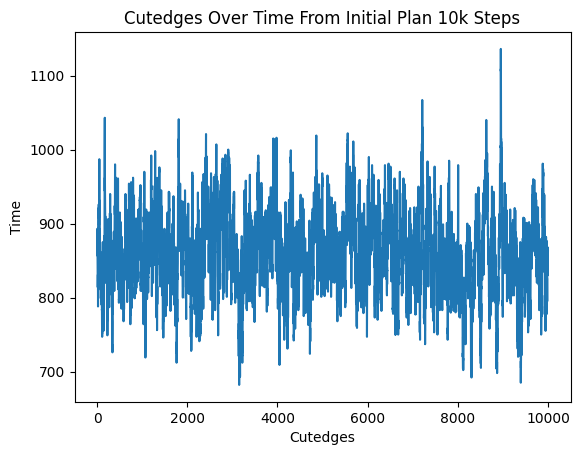

In [70]:
#cutedges over time from initial plan 10k steps
plt.figure()
plt.plot(cutedge_ensemble)
plt.xlabel('Cutedges')
plt.ylabel('Time')
plt.title('Cutedges Over Time From Initial Plan 10k Steps')
plt.show()

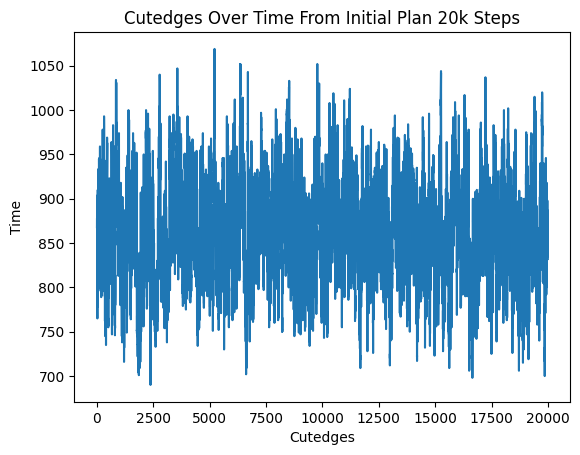

In [71]:
#cutedges over time from intial plan 20k steps
plt.figure()
plt.plot(cutedge_ensemble2)
plt.xlabel('Cutedges')
plt.ylabel('Time')
plt.title('Cutedges Over Time From Initial Plan 20k Steps')
plt.show()

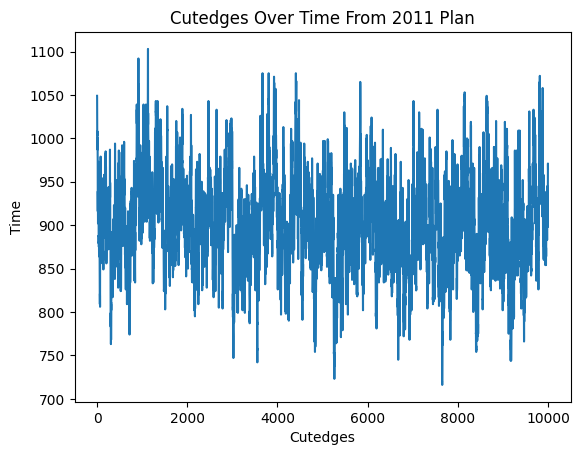

In [68]:
#cutedges over time from 2011 plan
plt.figure()
plt.plot(cutedge_ensemble_2011)
plt.xlabel('Cutedges')
plt.ylabel('Time')
plt.title('Cutedges Over Time From 2011 Plan')
plt.show()

In [29]:
# Initialize a dictionary to store the total BVAP and total population for each district
bvap_per_district = {}
total_pop_per_district = {}

# Loop through the nodes in the plan2011 assignment
for node, district in plan2011.assignment.items():
    # Get the BVAP and total population for each node
    bvap = mi_graph.nodes[node]['BVAP']
    total_pop = mi_graph.nodes[node]['TOTPOP']

    # Add the BVAP and total population to the respective district
    if district not in bvap_per_district:
        bvap_per_district[district] = 0
        total_pop_per_district[district] = 0

    bvap_per_district[district] += bvap
    total_pop_per_district[district] += total_pop

# Now compare BVAP to the total population for each district
majority_bvap_count = 0

for district in bvap_per_district:
    bvap = bvap_per_district[district]
    total_pop = total_pop_per_district[district]
    print("DISTRICT", district, "BVAP:", bvap, "total_pop:", total_pop)

    # Check if BVAP is greater than 50% of the total population for the district
    if bvap >= (total_pop / 2):
        majority_bvap_count += 1

# Print the count of districts with majority BVAP
print(f"Number of districts with majority BVAP in 2011 plan: {majority_bvap_count}")

DISTRICT 06 BVAP: 40604 total_pop: 704704
DISTRICT 14 BVAP: 299779 total_pop: 706110
DISTRICT 13 BVAP: 291161 total_pop: 705974
DISTRICT 10 BVAP: 13347 total_pop: 705408
DISTRICT 01 BVAP: 8643 total_pop: 707361
DISTRICT 09 BVAP: 47982 total_pop: 705839
DISTRICT 05 BVAP: 86340 total_pop: 706551
DISTRICT 04 BVAP: 10505 total_pop: 706002
DISTRICT 11 BVAP: 25450 total_pop: 705974
DISTRICT 02 BVAP: 29873 total_pop: 705741
DISTRICT 08 BVAP: 27797 total_pop: 705965
DISTRICT 12 BVAP: 52585 total_pop: 704978
DISTRICT 03 BVAP: 42373 total_pop: 706063
DISTRICT 07 BVAP: 21870 total_pop: 706970
Number of districts with majority BVAP in 2011 plan: 0


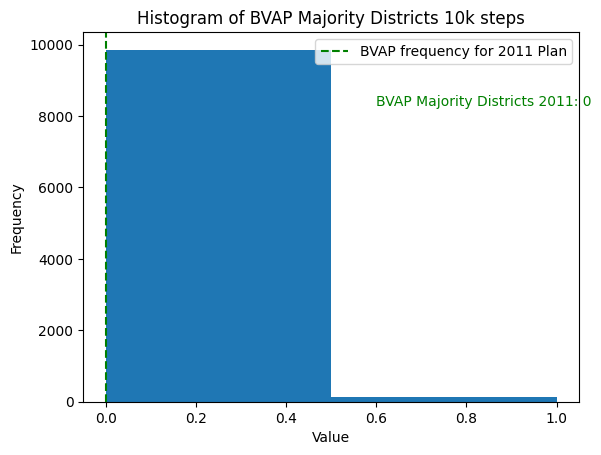

In [44]:
#Black majority districts 10k steps
plt.figure()
plt.hist(bmaj_ensemble, bins =[0,0.5,1])

# Add a vertical line or annotation for the count of majority BVAP districts
plt.axvline(x=majority_bvap_count, color='green', linestyle='--', label='BVAP frequency for 2011 Plan')
plt.text(0.6, plt.ylim()[1]*0.8, f'BVAP Majority Districts 2011: {majority_bvap_count}', color='green')

# Add labels and title
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram of BVAP Majority Districts 10k steps')
plt.legend()

# Show the plot
plt.show()

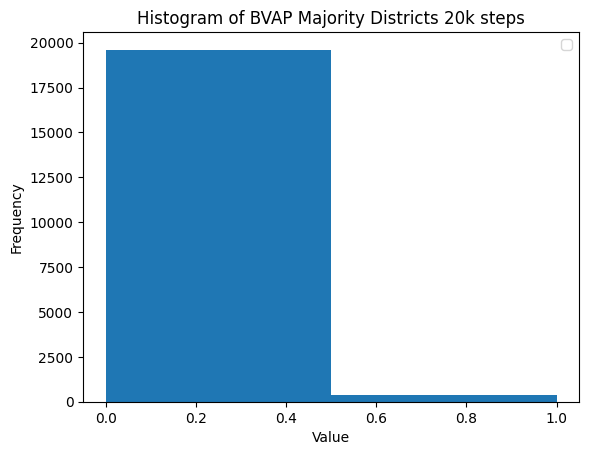

In [43]:
#Black majority districts 20k steps
plt.figure()
plt.hist(bmaj_ensemble2, bins = [0,0.5,1])

# Add labels and title
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram of BVAP Majority Districts 20k steps')

plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


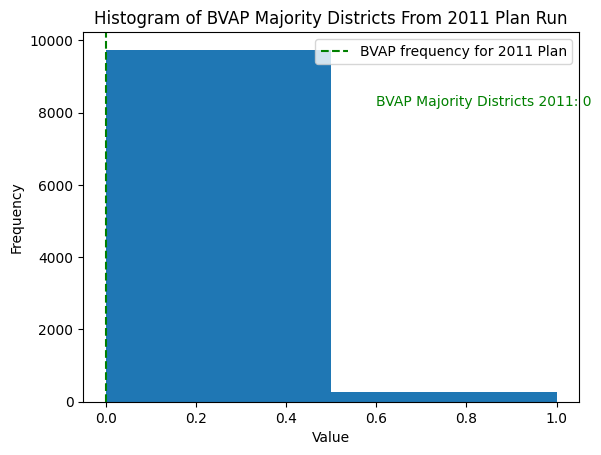

In [72]:
#Black majority districts 2011 Plan Run
plt.figure()
plt.hist(bmaj_ensemble_2011, bins =[0,0.5,1])

# Add a vertical line or annotation for the count of majority BVAP districts
plt.axvline(x=majority_bvap_count, color='green', linestyle='--', label='BVAP frequency for 2011 Plan')
plt.text(0.6, plt.ylim()[1]*0.8, f'BVAP Majority Districts 2011: {majority_bvap_count}', color='green')

# Add labels and title
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram of BVAP Majority Districts From 2011 Plan Run')
plt.legend()

# Show the plot
plt.show()

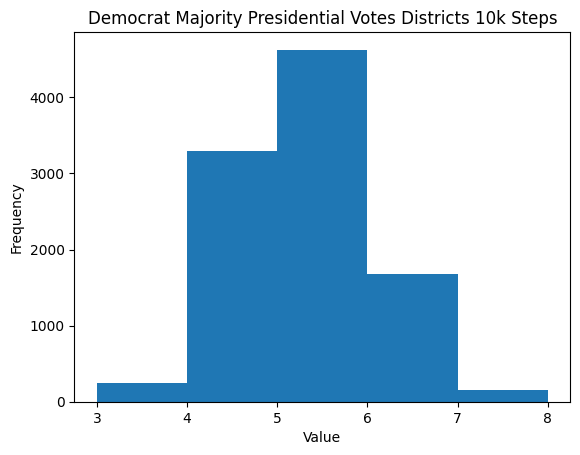

In [45]:
#democratic districts 10k steps
plt.figure()
plt.hist(d_ensemble, bins = [3,4,5,6,7,8])
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Democrat Majority Presidential Votes Districts 10k Steps')
plt.show()

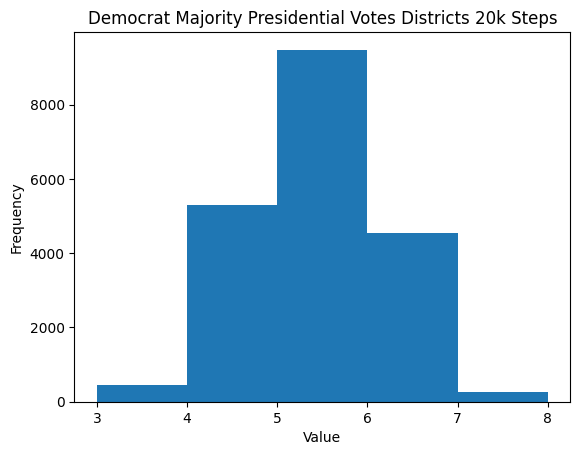

In [46]:
#democratic districts (double run)
plt.figure()
plt.hist(d_ensemble2, bins = [3,4,5,6,7,8])
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Democrat Majority Presidential Votes Districts 20k Steps')
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


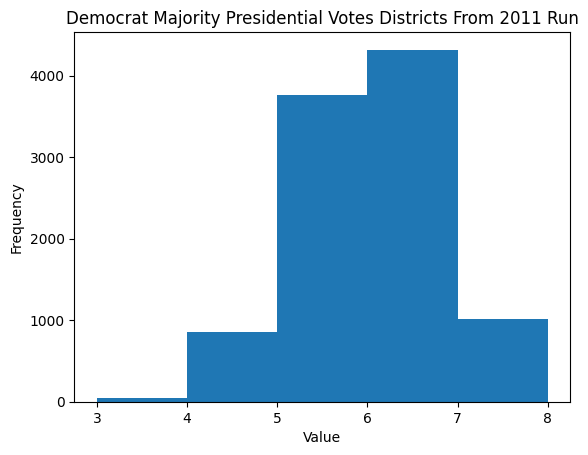

In [74]:
#democratic districts 2011 run
plt.figure()
plt.hist(d_ensemble_2011, bins = [3,4,5,6,7,8])
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Democrat Majority Presidential Votes Districts From 2011 Run')
plt.show()

Boxplots:


[[0.00743814 0.01985444 0.02069599 ... 0.20335591 0.23993252 0.36979689]
 [0.00743814 0.02069599 0.03653037 ... 0.20335591 0.23993252 0.36979689]
 [0.00743814 0.02069599 0.03653037 ... 0.20335591 0.27799838 0.33201464]
 ...
 [0.02747074 0.03134027 0.03483581 ... 0.11264974 0.11792636 0.47514094]
 [0.02747074 0.03134027 0.0319628  ... 0.11264974 0.11792636 0.47514094]
 [0.02747074 0.03134027 0.03165313 ... 0.11264974 0.11792636 0.47514094]]


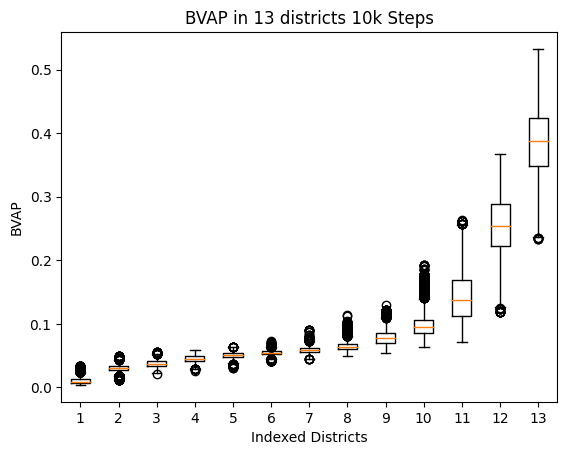

In [47]:
a = np.array(bpop)
print(a)
plt.figure()
plt.boxplot(a)
plt.xlabel('Indexed Districts')
plt.ylabel('BVAP')
plt.title('BVAP in 13 districts 10k Steps')
plt.show()

[[0.00743814 0.01985444 0.02069599 ... 0.20335591 0.23993252 0.36979689]
 [0.00743814 0.01985444 0.02069599 ... 0.20296251 0.23993252 0.36979689]
 [0.00743814 0.01985444 0.03683104 ... 0.16579098 0.23993252 0.36979689]
 ...
 [0.01062377 0.03074477 0.04015258 ... 0.20326548 0.22754685 0.37525938]
 [0.01062377 0.03074477 0.04015258 ... 0.19167926 0.22754685 0.37525938]
 [0.01062377 0.03074477 0.04015258 ... 0.19167926 0.22754685 0.37525938]]


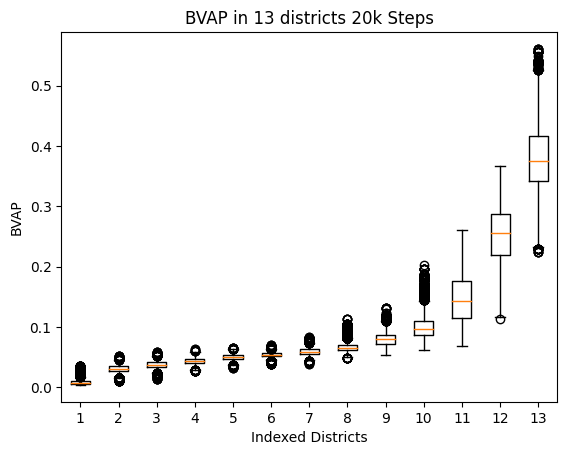

In [48]:
a = np.array(bpop2)
print(a)
plt.figure()
plt.boxplot(a)
plt.xlabel('Indexed Districts')
plt.ylabel('BVAP')
plt.title('BVAP in 13 districts 20k Steps')
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[[0.01221865 0.01487956 0.01892096 ... 0.12219925 0.41242454 0.42455   ]
 [0.01221865 0.01487956 0.01892096 ... 0.12219925 0.41242454 0.42455   ]
 [0.01221865 0.01487956 0.01892096 ... 0.12219925 0.41242454 0.42455   ]
 ...
 [0.01509945 0.0332914  0.0407915  ... 0.12025231 0.26708896 0.44842739]
 [0.01516314 0.0332914  0.0407915  ... 0.12025231 0.26708896 0.44842739]
 [0.01516314 0.03138676 0.0407915  ... 0.12025231 0.27279005 0.44842739]]


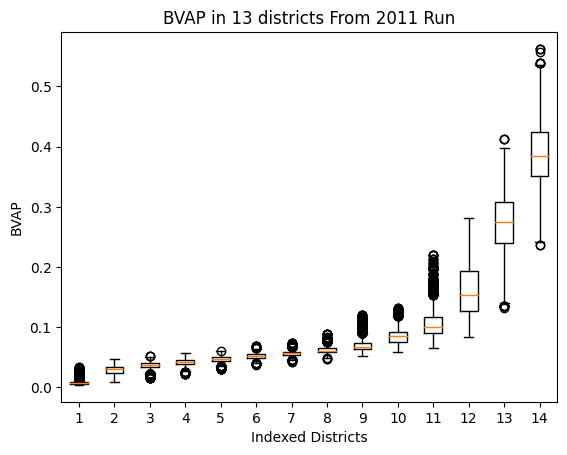

In [75]:
a = np.array(bpop_2011)
print(a)
plt.figure()
plt.boxplot(a)
plt.xlabel('Indexed Districts')
plt.ylabel('BVAP')
plt.title('BVAP in 13 districts From 2011 Run')
plt.show()

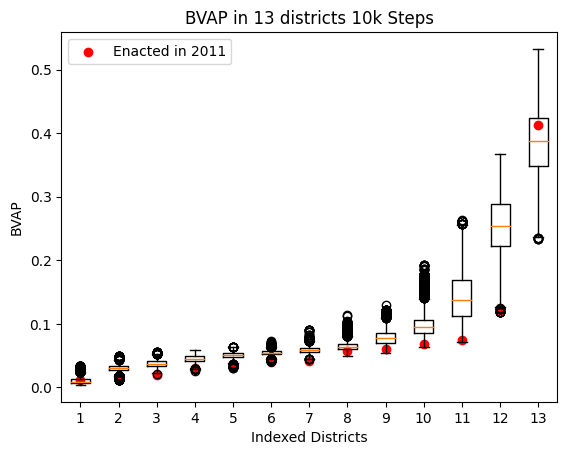

In [52]:
a = np.array(bpop)
dist_bpop = [0] * num_dist
dist_pop = [0] * num_dist

for v in mi_graph.nodes():
    dist = int(mi_graph.nodes()[v]["CD"]) - 1  # Correct the indexing to start from 0
    if 0 <= dist < num_dist:  # Check that the index is within the valid range
        dist_bpop[dist] += mi_graph.nodes()[v]["BVAP"]
        dist_pop[dist] += mi_graph.nodes()[v]["TOTPOP"]
    else:
        pass

# Calculate BPOP Fraction for each district, sort it
dist_frac = [dist_bpop[i] / dist_pop[i] if dist_pop[i] > 0 else 0 for i in range(num_dist)]
dist_frac.sort()

# Plot points on top of boxplot
plt.figure()
plt.boxplot(a)
plt.scatter(x=range(1, num_dist + 1), y=dist_frac, color="red", label='Enacted in 2011')
plt.xlabel('Indexed Districts')
plt.ylabel('BVAP')
plt.title('BVAP in 13 districts 10k Steps')
plt.legend()
plt.show()


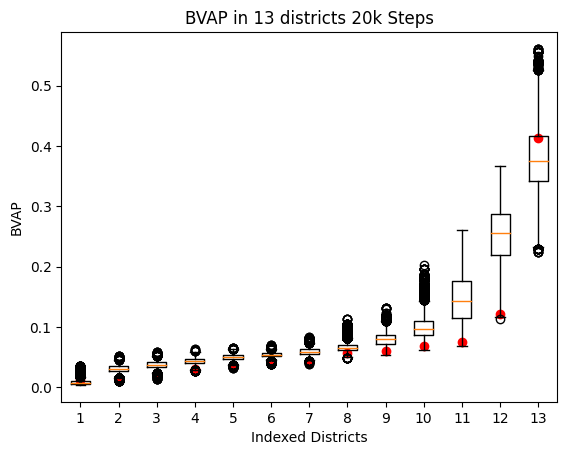

In [53]:
a = np.array(bpop2)
dist_bpop = [0] * num_dist
dist_pop = [0] * num_dist

for v in mi_graph.nodes():
    dist = int(mi_graph.nodes()[v]["CD"]) - 1  # Correct the indexing to start from 0
    if 0 <= dist < num_dist:  # Check that the index is within the valid range
        dist_bpop[dist] += mi_graph.nodes()[v]["BVAP"]
        dist_pop[dist] += mi_graph.nodes()[v]["TOTPOP"]
    else:
        pass

# Calculate BPOP Fraction for each district, sort it
dist_frac = [dist_bpop[i] / dist_pop[i] if dist_pop[i] > 0 else 0 for i in range(num_dist)]
dist_frac.sort()

# Plot points on top of boxplot
plt.figure()
plt.boxplot(a)
plt.scatter(x=range(1, num_dist + 1), y=dist_frac, color="red", label='Enacted in 2011')
plt.xlabel('Indexed Districts')
plt.ylabel('BVAP')
plt.title('BVAP in 13 districts 20k Steps')
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


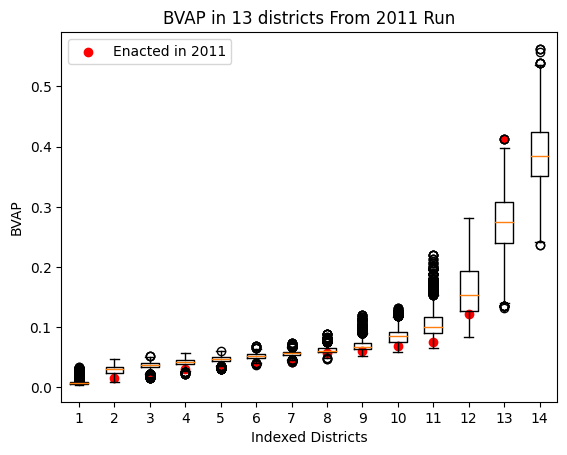

In [76]:
a = np.array(bpop_2011)
dist_bpop = [0] * num_dist
dist_pop = [0] * num_dist

for v in mi_graph.nodes():
    dist = int(mi_graph.nodes()[v]["CD"]) - 1  # Correct the indexing to start from 0
    if 0 <= dist < num_dist:  # Check that the index is within the valid range
        dist_bpop[dist] += mi_graph.nodes()[v]["BVAP"]
        dist_pop[dist] += mi_graph.nodes()[v]["TOTPOP"]
    else:
        pass

# Calculate BPOP Fraction for each district, sort it
dist_frac = [dist_bpop[i] / dist_pop[i] if dist_pop[i] > 0 else 0 for i in range(num_dist)]
dist_frac.sort()

# Plot points on top of boxplot
plt.figure()
plt.boxplot(a)
plt.scatter(x=range(1, num_dist + 1), y=dist_frac, color="red", label='Enacted in 2011')
plt.xlabel('Indexed Districts')
plt.ylabel('BVAP')
plt.title('BVAP in 13 districts From 2011 Run')
plt.legend()
plt.show()